# All State

In [ ]:
Regression problem

In [71]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time
from sklearn.metrics import f1_score
from pandas.tools.plotting import scatter_matrix
from sklearn import preprocessing
from IPython.display import display
from statsmodels.graphics.mosaicplot import mosaic


# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

from subprocess import check_output
print(check_output(["ls", "./"]).decode("utf8"))
# Any results you write to the current directory are saved as output.
train = pd.read_csv("./train.csv")
train.describe(include = ['object'])
display(train.head(5))

loss = train['loss']
features=train.drop('loss',axis=1)
print ("dataset has {} data points with {} variables each.".format(*train.shape))

display(loss.describe())
#display(features.describe())
#observation max loss is hugh outlier


for i in train.columns:
    if (train[i].isnull().sum() > 0):
      print("missing data in feature {}", i)


allstate.ipynb
allstate.py
renders.py
renders.pyc
sample_submission.csv
sample_submission.csv.zip
test.csv
test.csv.zip
train_bak.csv
train.csv
train.csv.zip



,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,...,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,...,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,...,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,...,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,...,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


dataset has 188318 data points with 132 variables each.


count    188318.000000
mean       3037.337686
std        2904.086186
min           0.670000
25%        1204.460000
50%        2115.570000
75%        3864.045000
max      121012.250000
Name: loss, dtype: float64

['cont1', 'cont2', 'cont3', 'cont4', 'cont5', 'cont6', 'cont7', 'cont8', 'cont9', 'cont10', 'cont11', 'cont12', 'cont13', 'cont14', 'loss']
['cat1', 'cat2', 'cat3', 'cat4', 'cat5', 'cat6', 'cat7', 'cat8', 'cat9', 'cat10', 'cat11', 'cat12', 'cat13', 'cat14', 'cat15', 'cat16', 'cat17', 'cat18', 'cat19', 'cat20', 'cat21', 'cat22', 'cat23', 'cat24', 'cat25', 'cat26', 'cat27', 'cat28', 'cat29', 'cat30', 'cat31', 'cat32', 'cat33', 'cat34', 'cat35', 'cat36', 'cat37', 'cat38', 'cat39', 'cat40', 'cat41', 'cat42', 'cat43', 'cat44', 'cat45', 'cat46', 'cat47', 'cat48', 'cat49', 'cat50', 'cat51', 'cat52', 'cat53', 'cat54', 'cat55', 'cat56', 'cat57', 'cat58', 'cat59', 'cat60', 'cat61', 'cat62', 'cat63', 'cat64', 'cat65', 'cat66', 'cat67', 'cat68', 'cat69', 'cat70', 'cat71', 'cat72', 'cat73', 'cat74', 'cat75', 'cat76', 'cat77', 'cat78', 'cat79', 'cat80', 'cat81', 'cat82', 'cat83', 'cat84', 'cat85', 'cat86', 'cat87', 'cat88', 'cat89', 'cat90', 'cat91', 'cat92', 'cat93', 'cat94', 'cat95', 'cat96', 'cat

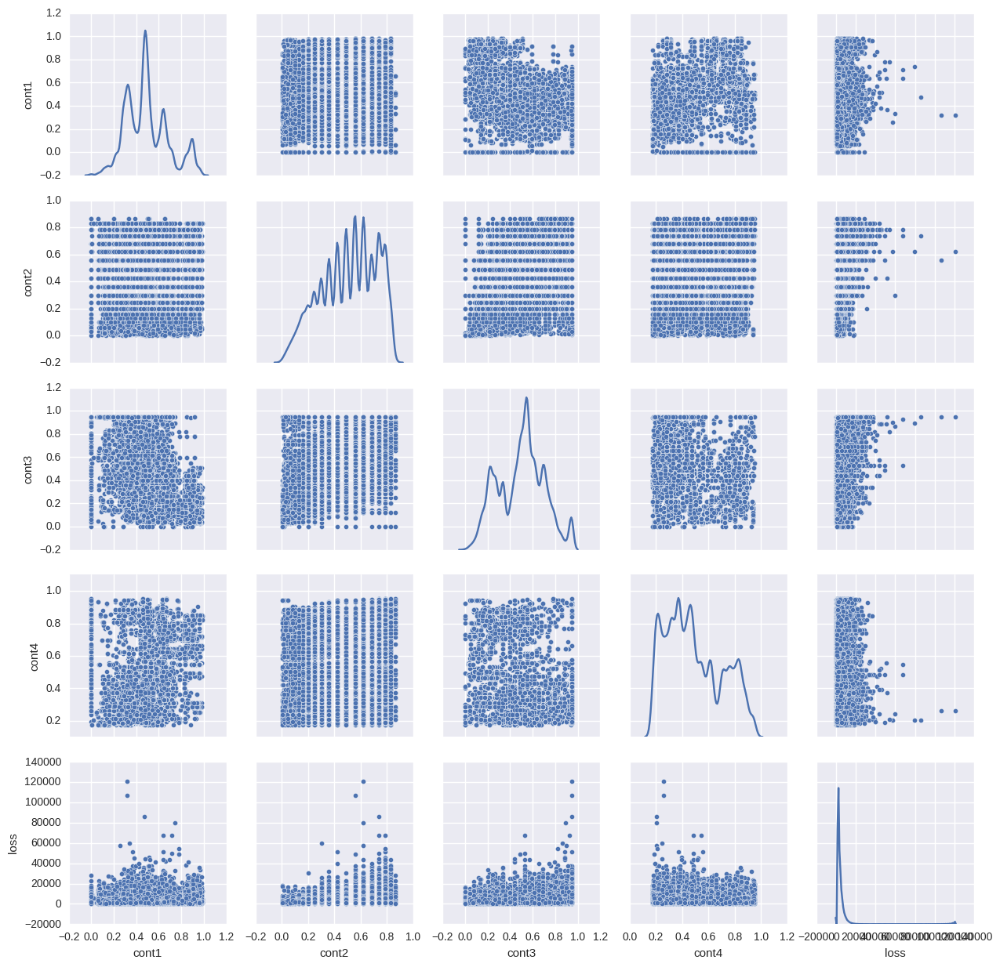

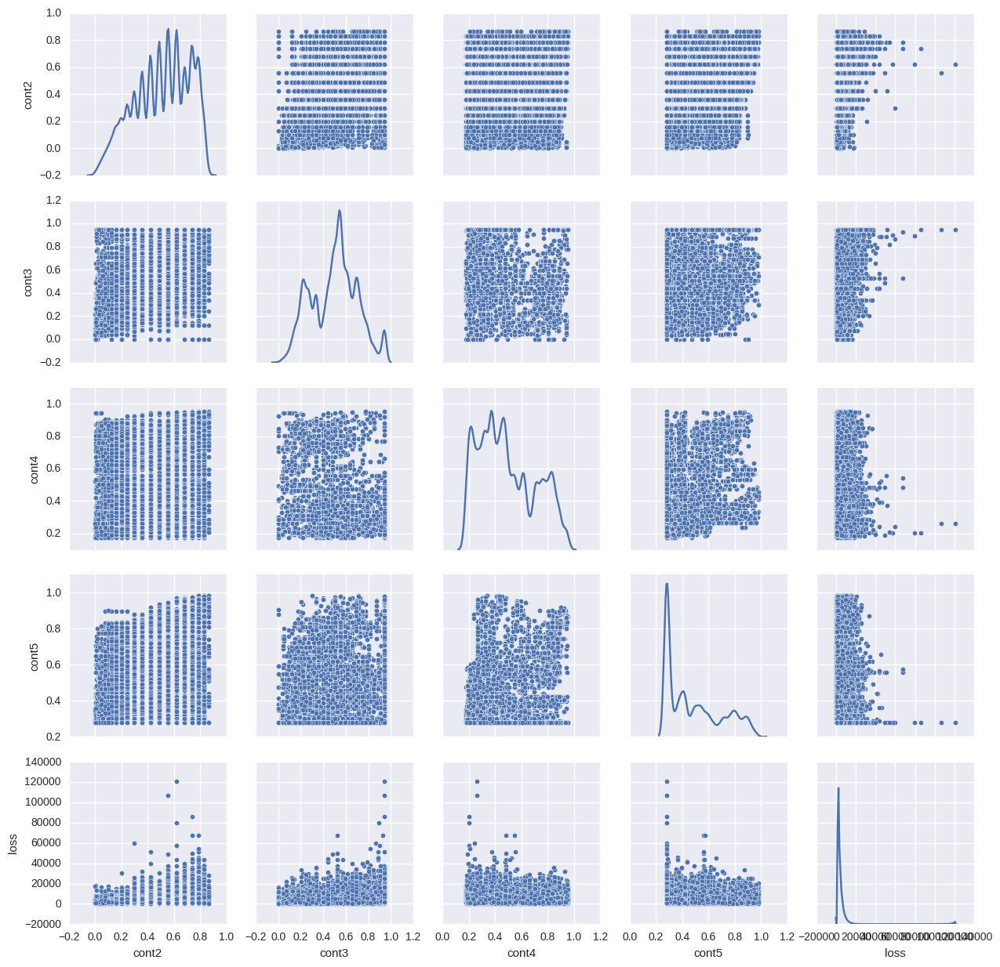

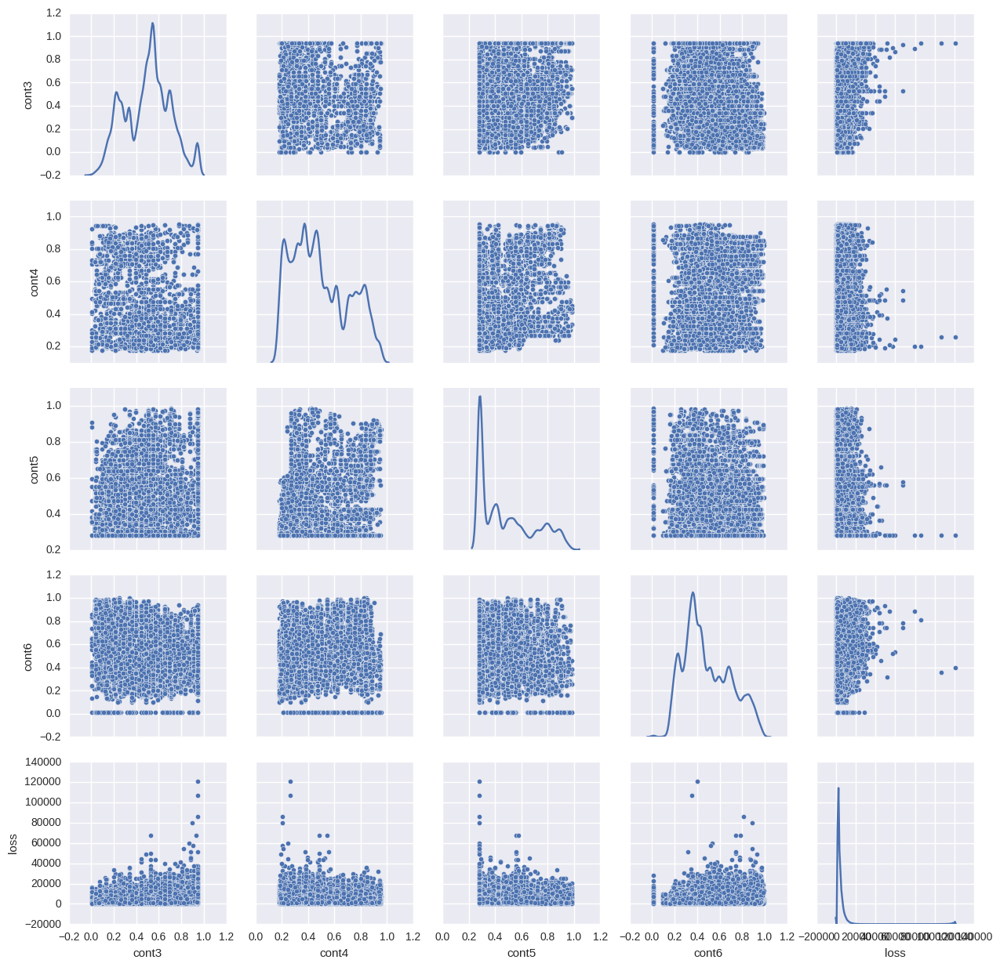

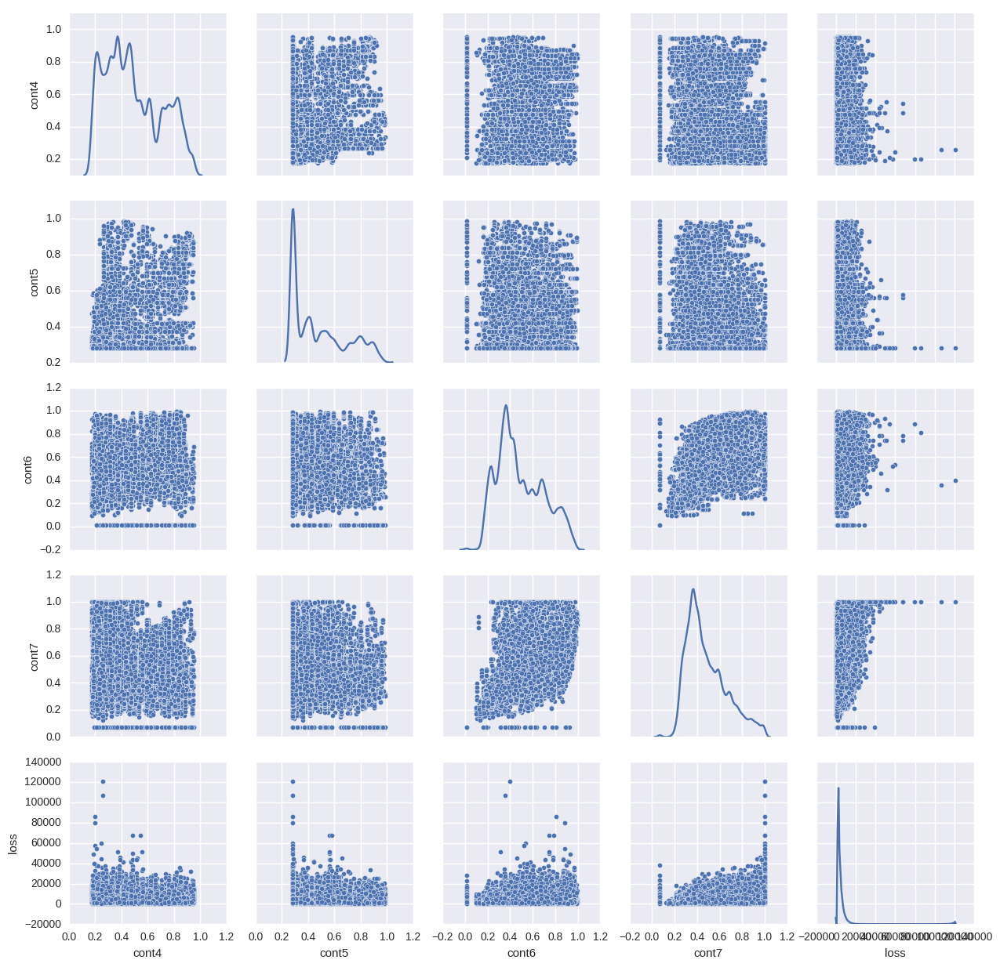

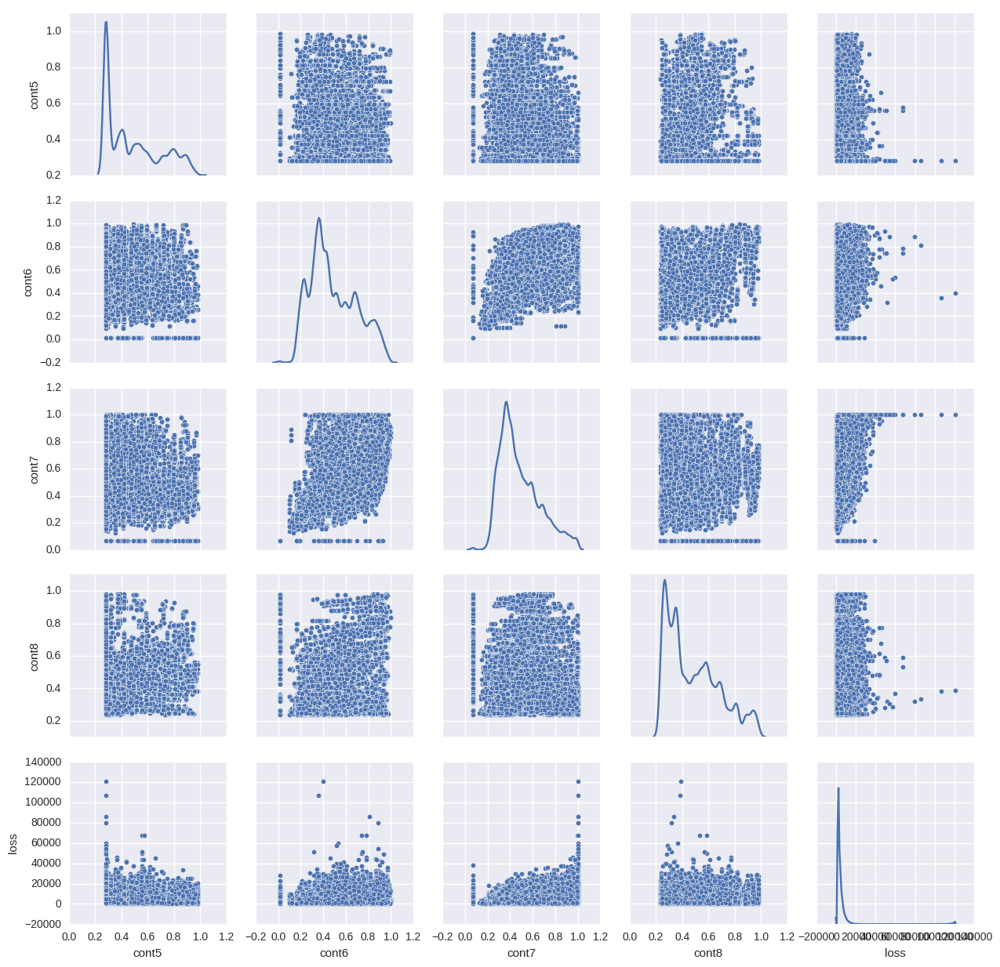

...

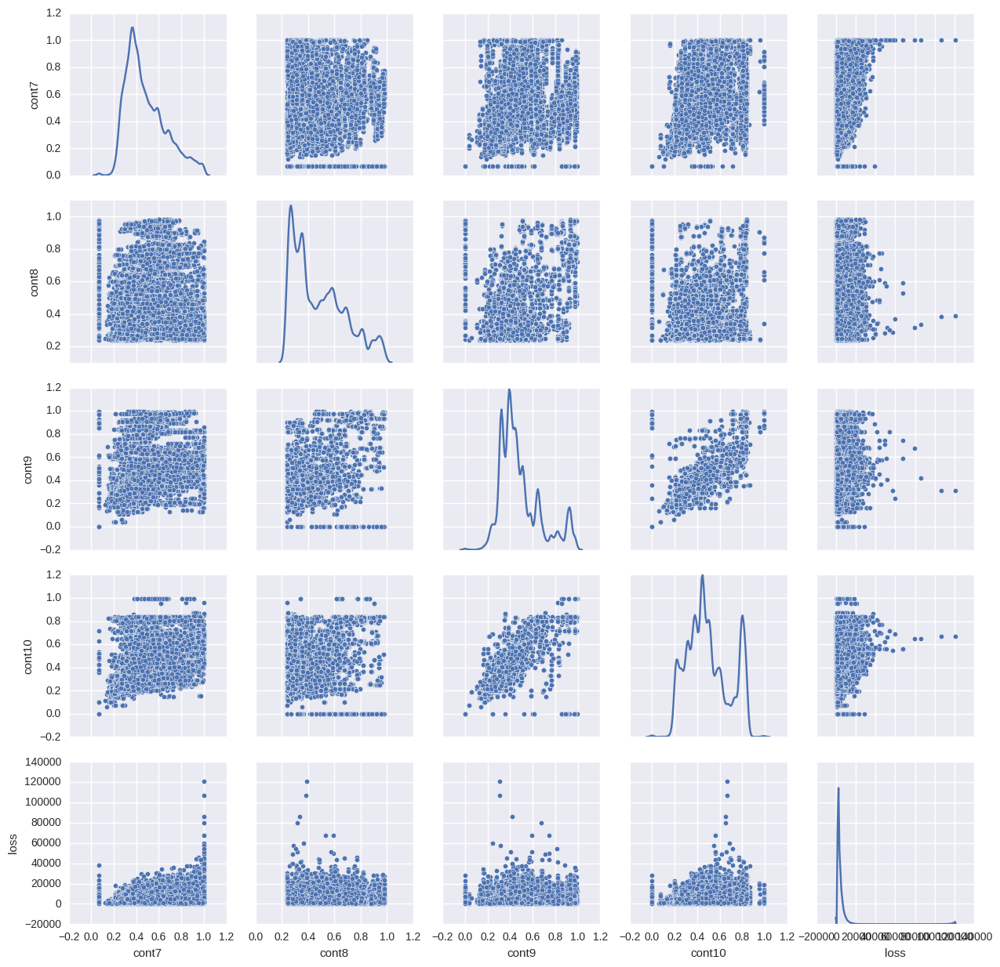

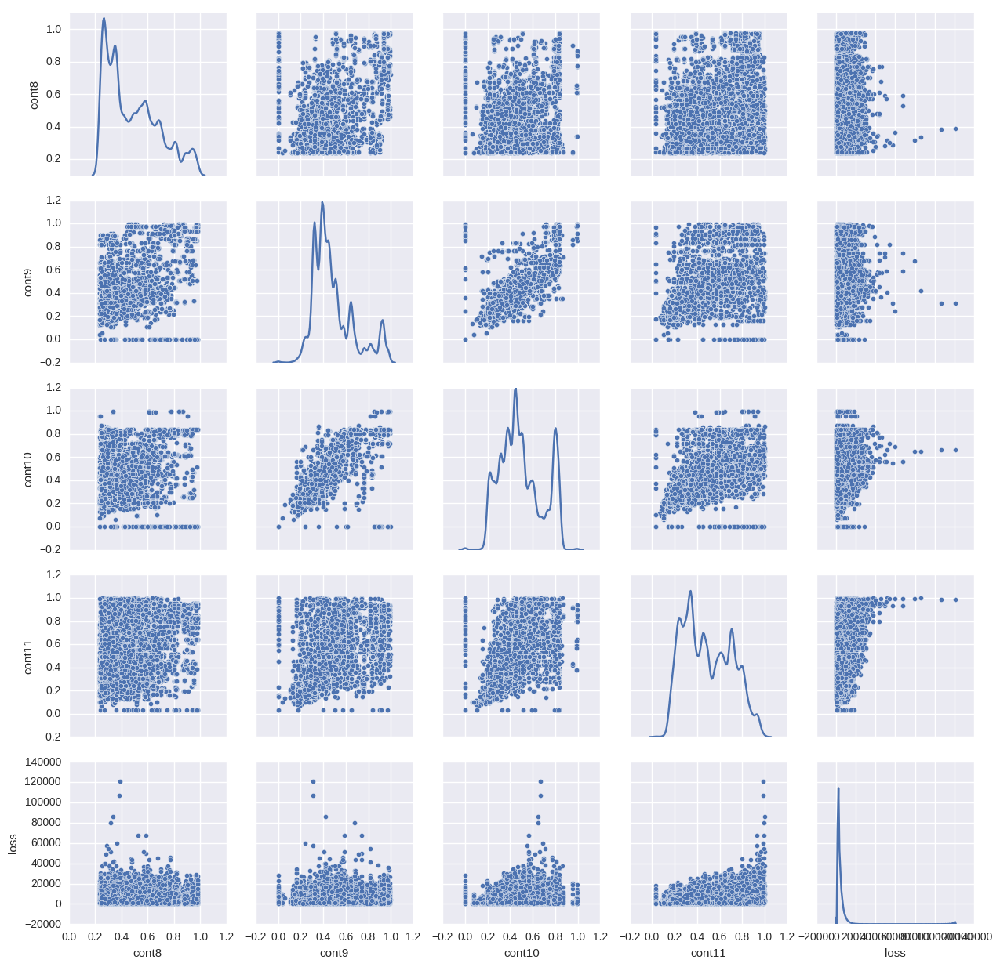

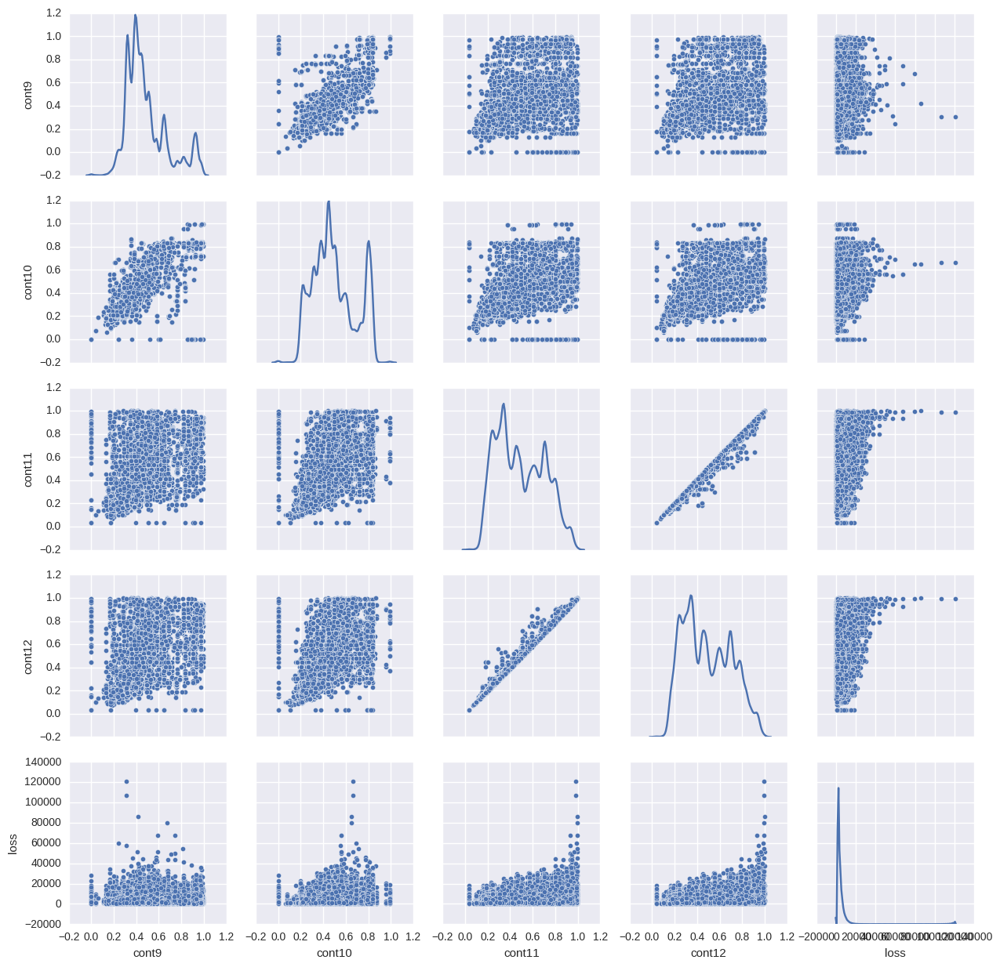

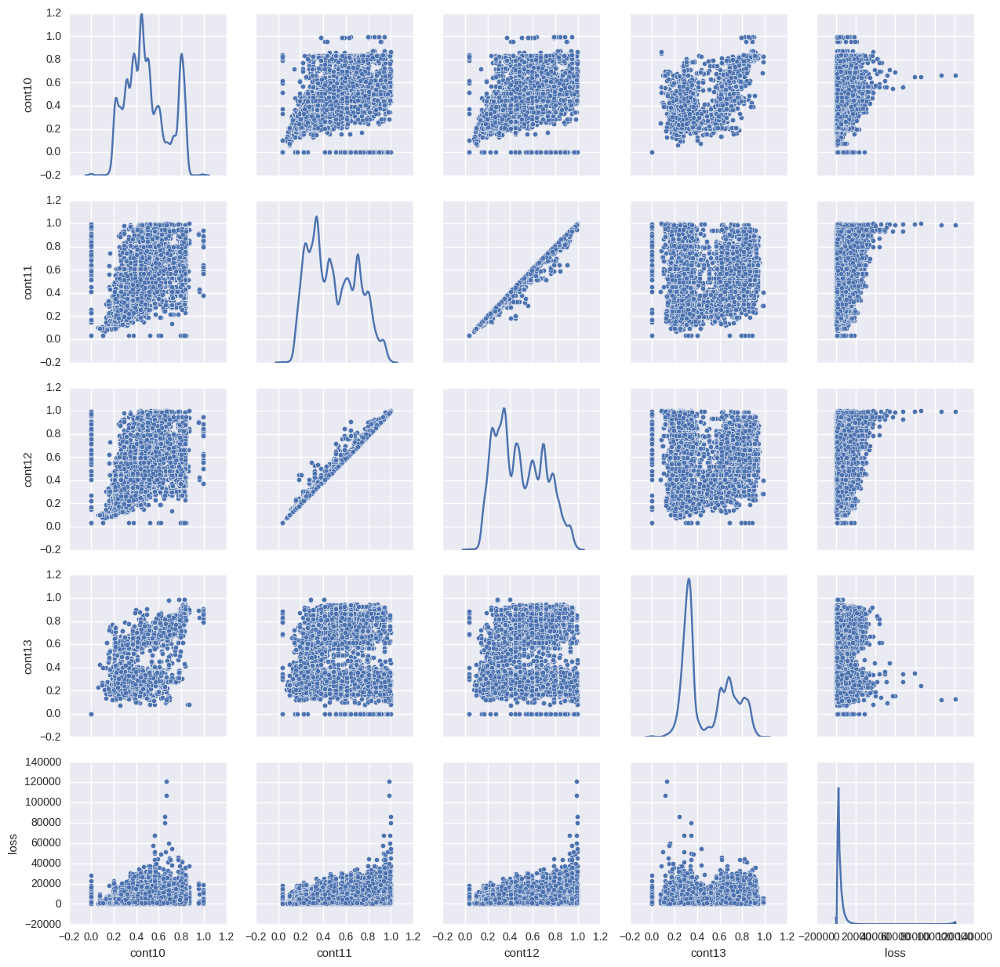

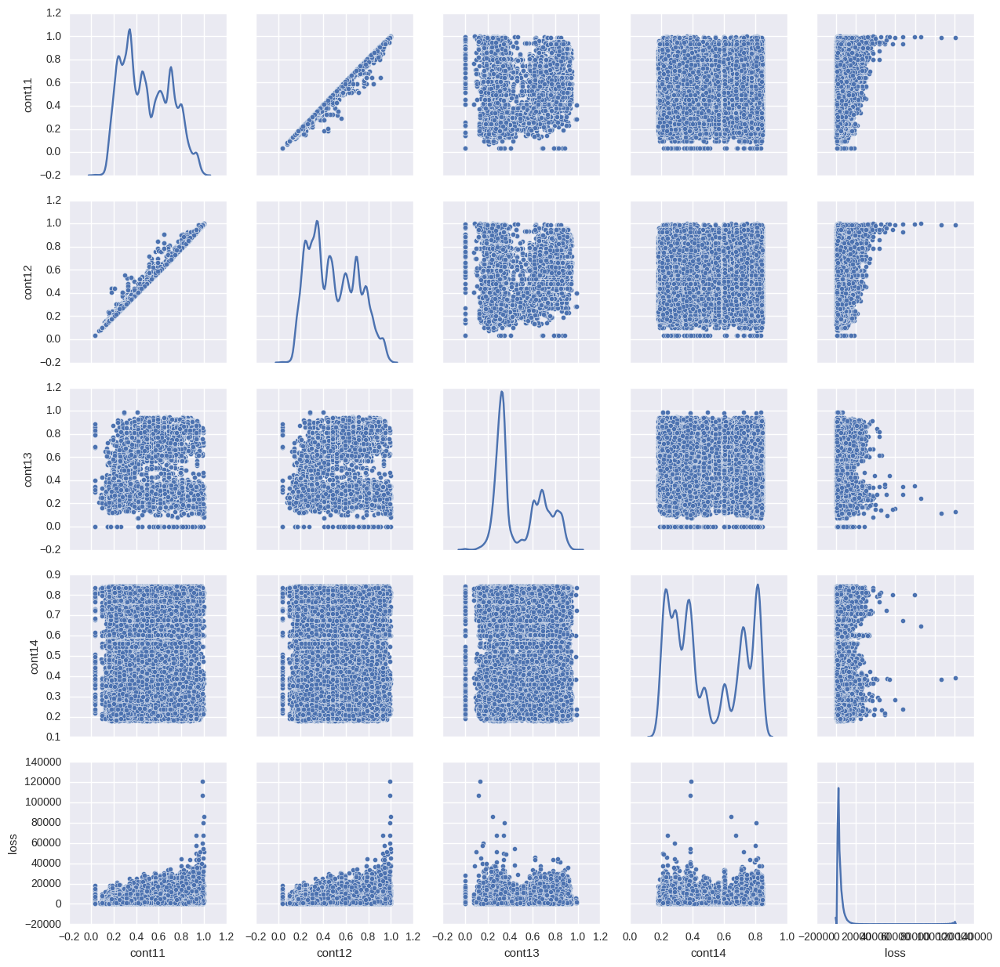

In [72]:

cont_columns = []
cat_columns = []

for i in train.columns:
    if train[i].dtype == 'float':
        cont_columns.append(i)
    elif train[i].dtype == 'object':
        cat_columns.append(i)
print cont_columns
print cat_columns

print len(cont_columns)
for i in range(len(cont_columns)-4):
 vars=[cont_columns[i],cont_columns[i+1],cont_columns[i+2],cont_columns[i+3],'loss']
 print vars
 plt.figure()
 sns.pairplot(train[cont_columns], vars=[cont_columns[i],cont_columns[i+1],cont_columns[i+2],cont_columns[i+3],'loss'], kind = 'scatter',diag_kind='kde')
plt.show()
        

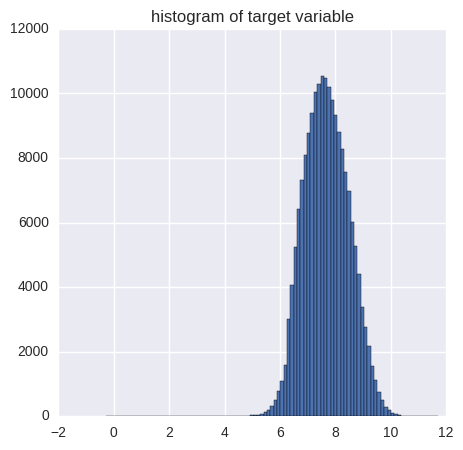

In [73]:
plt.figure(figsize=(5,5))
#plt.hist(train.loss, bins=100)
plt.title("histogram of target variable")
plt.hist(np.log(train.loss), bins=100)
#plt.hist(np.log(train.loss), bins=100)
plt.show()



In [75]:
def handle_non_numeric_data(df):
    columns=df.columns.values
    for column in columns:
       if (df[column].dtype == 'object'):
        #print column,df[column].dtype
        le = preprocessing.LabelEncoder()
        le.fit(df[column])
        list(le.classes_)
        df[column]=le.transform(df[column])
        #print "Column", column, "List", list(le.classes_)

    return

handle_non_numeric_data(train)
print train.head(5)
train_cont=train[cont_columns]
display(train_cont.head(5))
train_cat=train[cat_columns]
display(train_cat.head(5))



   id  cat1  cat2  cat3  cat4  cat5  cat6  cat7  cat8  cat9   ...     \
0   1     0     1     0     1     0     0     0     0     1   ...      
1   2     0     1     0     0     0     0     0     0     1   ...      
2   5     0     1     0     0     1     0     0     0     1   ...      
3  10     1     1     0     1     0     0     0     0     1   ...      
4  11     0     1     0     1     0     0     0     0     1   ...      

      cont6     cont7    cont8    cont9   cont10    cont11    cont12  \
0  0.718367  0.335060  0.30260  0.67135  0.83510  0.569745  0.594646   
1  0.438917  0.436585  0.60087  0.35127  0.43919  0.338312  0.366307   
2  0.289648  0.315545  0.27320  0.26076  0.32446  0.381398  0.373424   
3  0.440945  0.391128  0.31796  0.32128  0.44467  0.327915  0.321570   
4  0.178193  0.247408  0.24564  0.22089  0.21230  0.204687  0.202213   

     cont13    cont14     loss  
0  0.822493  0.714843  2213.18  
1  0.611431  0.304496  1283.60  
2  0.195709  0.774425  3005.09  
3 

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,...,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116
0,0,1,0,1,0,0,0,0,1,0,...,9,6,45,28,2,19,55,0,14,269
1,0,1,0,0,0,0,0,0,1,1,...,10,10,33,65,0,22,38,0,14,85
2,0,1,0,0,1,0,0,0,1,1,...,5,0,2,85,0,28,5,0,8,153
3,1,1,0,1,0,0,0,0,1,0,...,10,10,33,67,2,39,4,0,14,79
4,0,1,0,1,0,0,0,0,1,1,...,6,1,66,50,2,50,38,0,10,55


/home/ssood/.local/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


188318


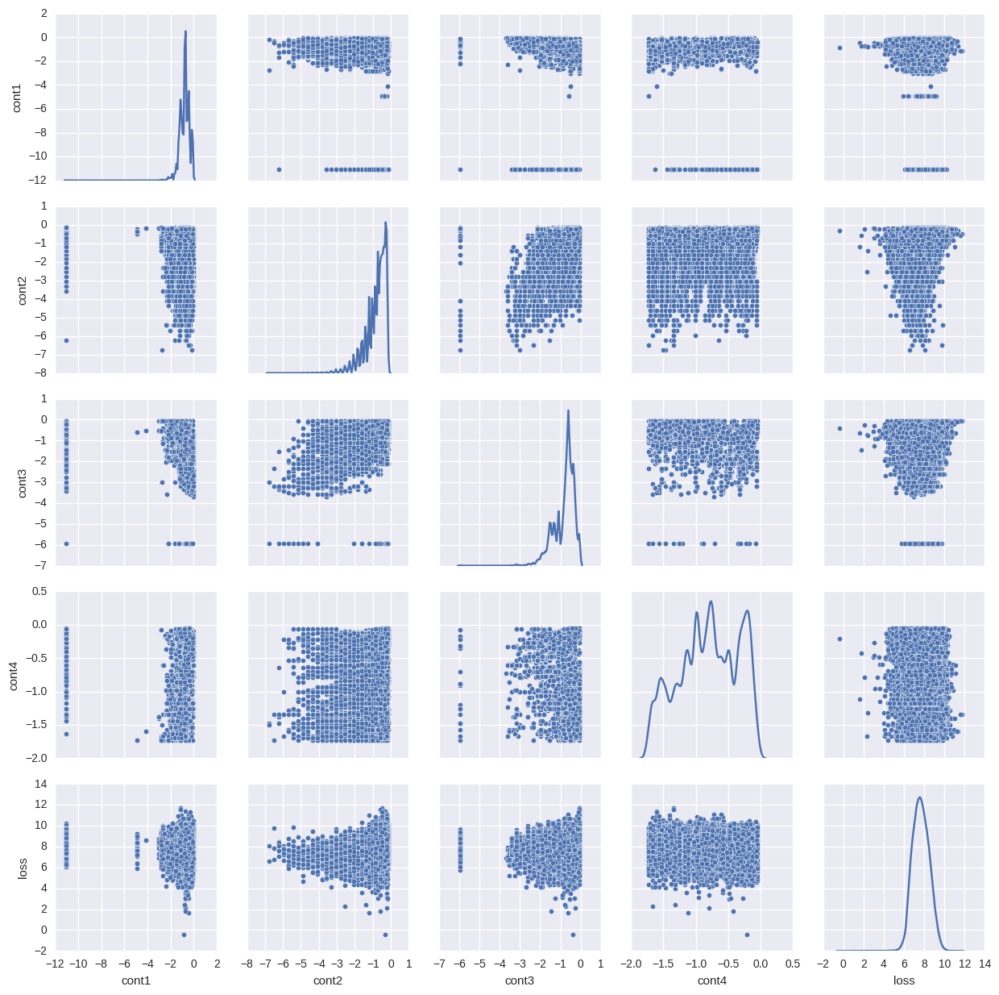

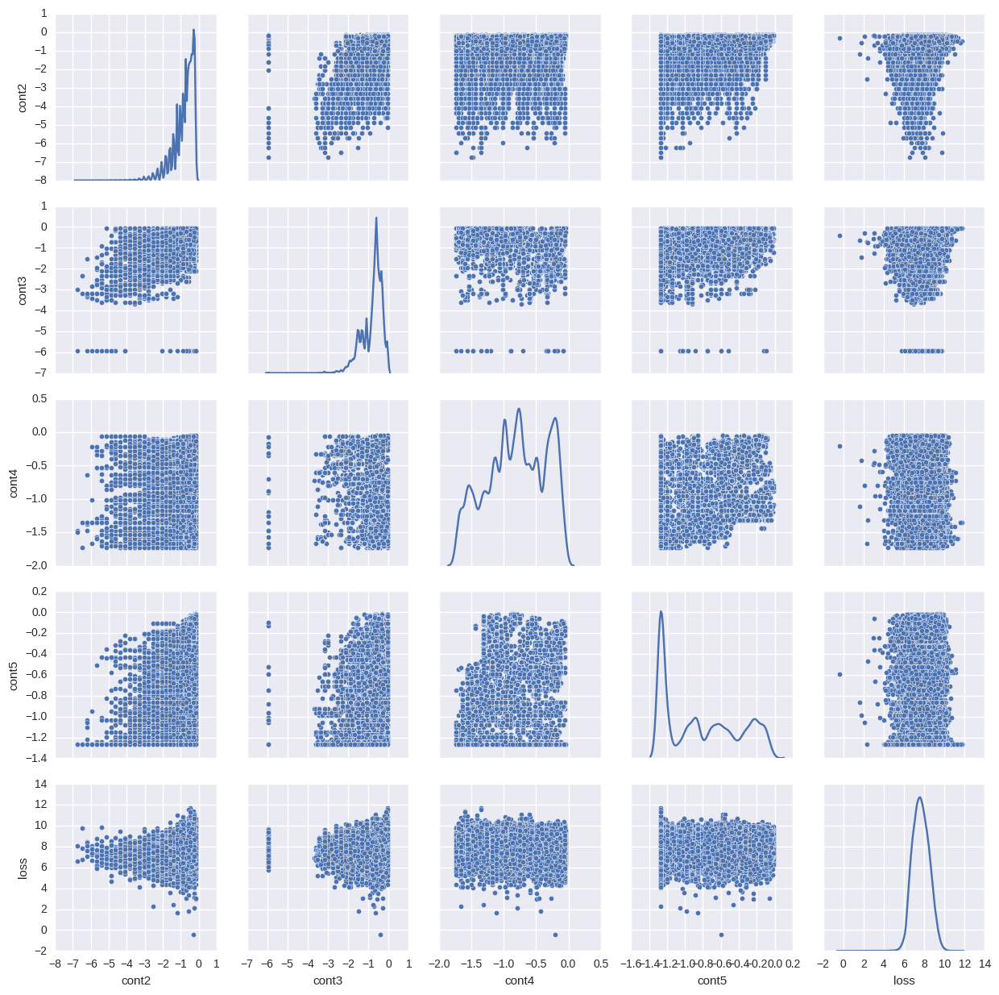

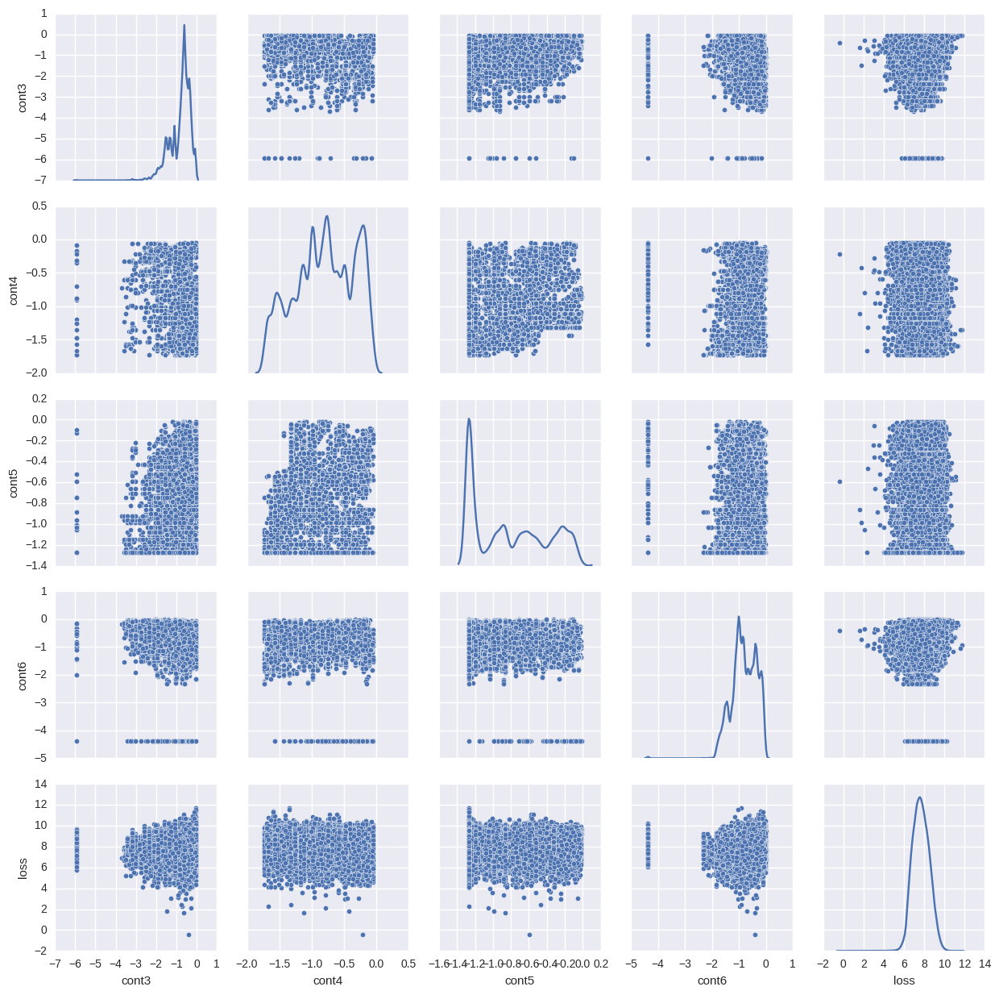

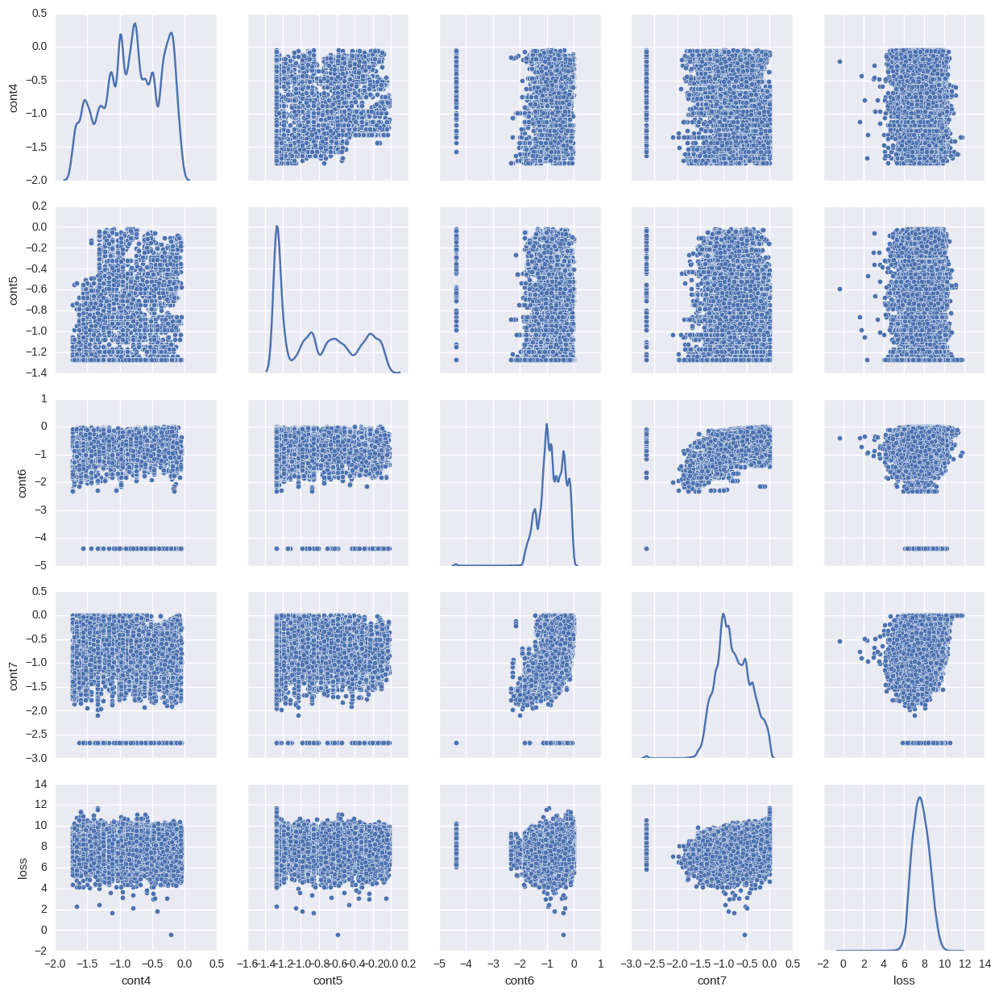

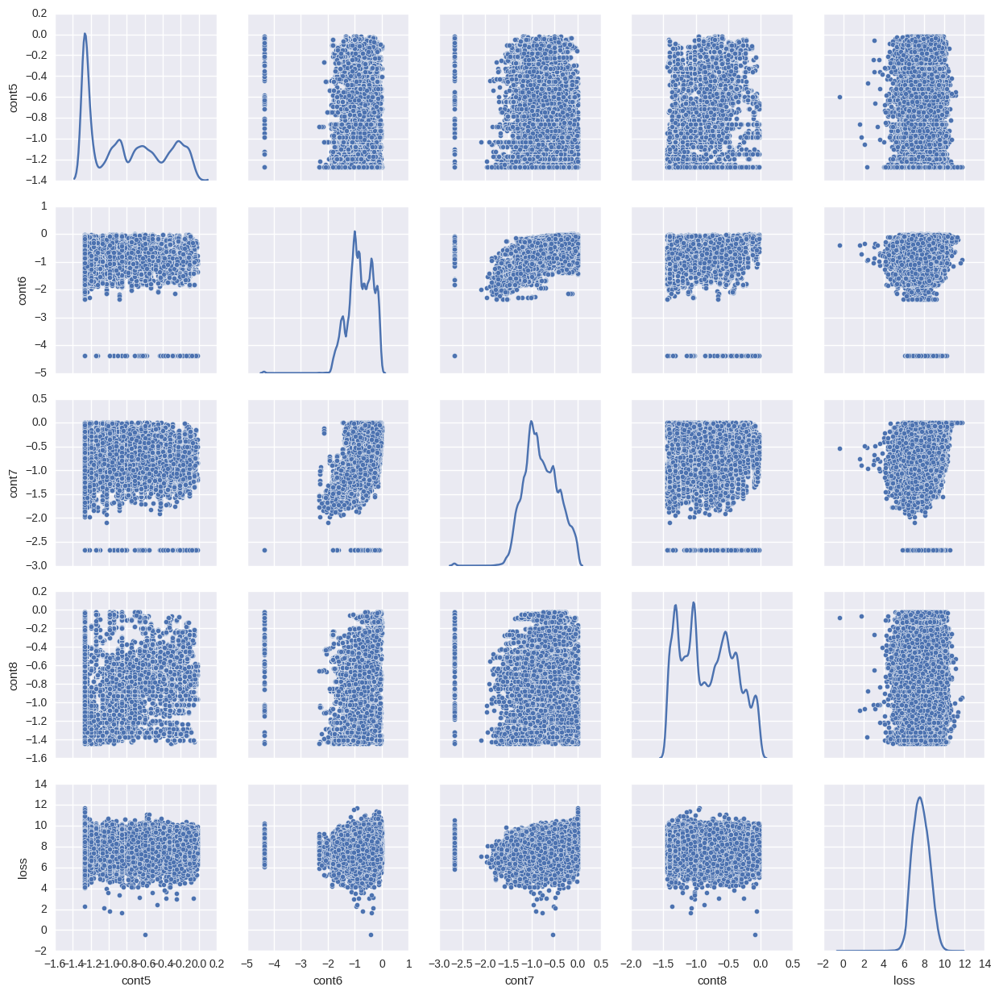

...

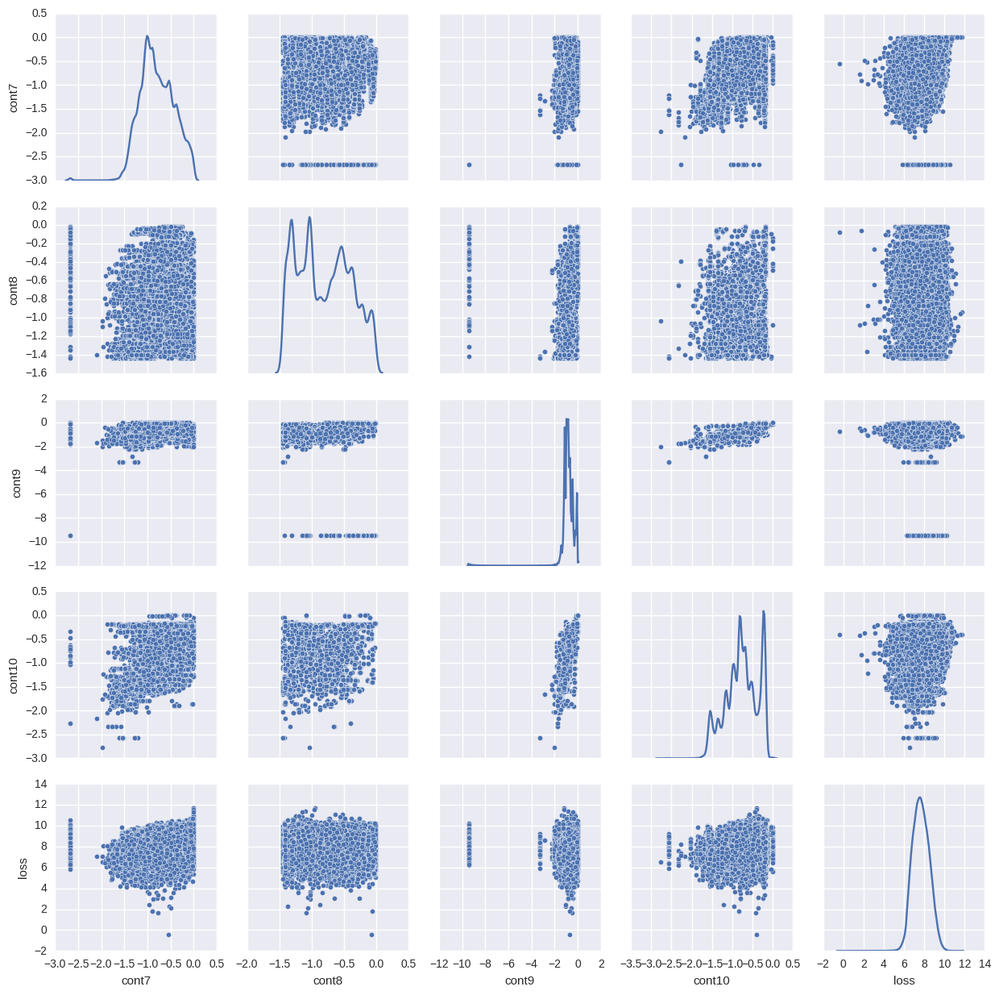

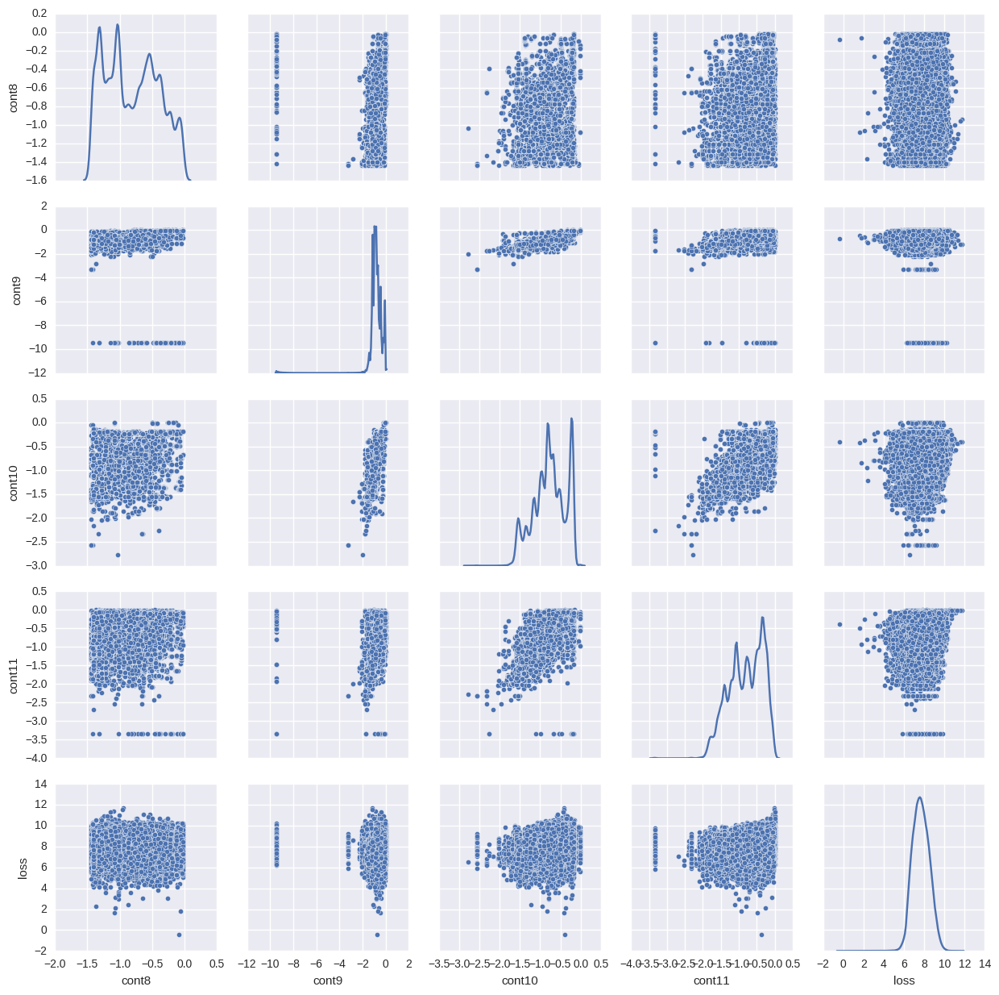

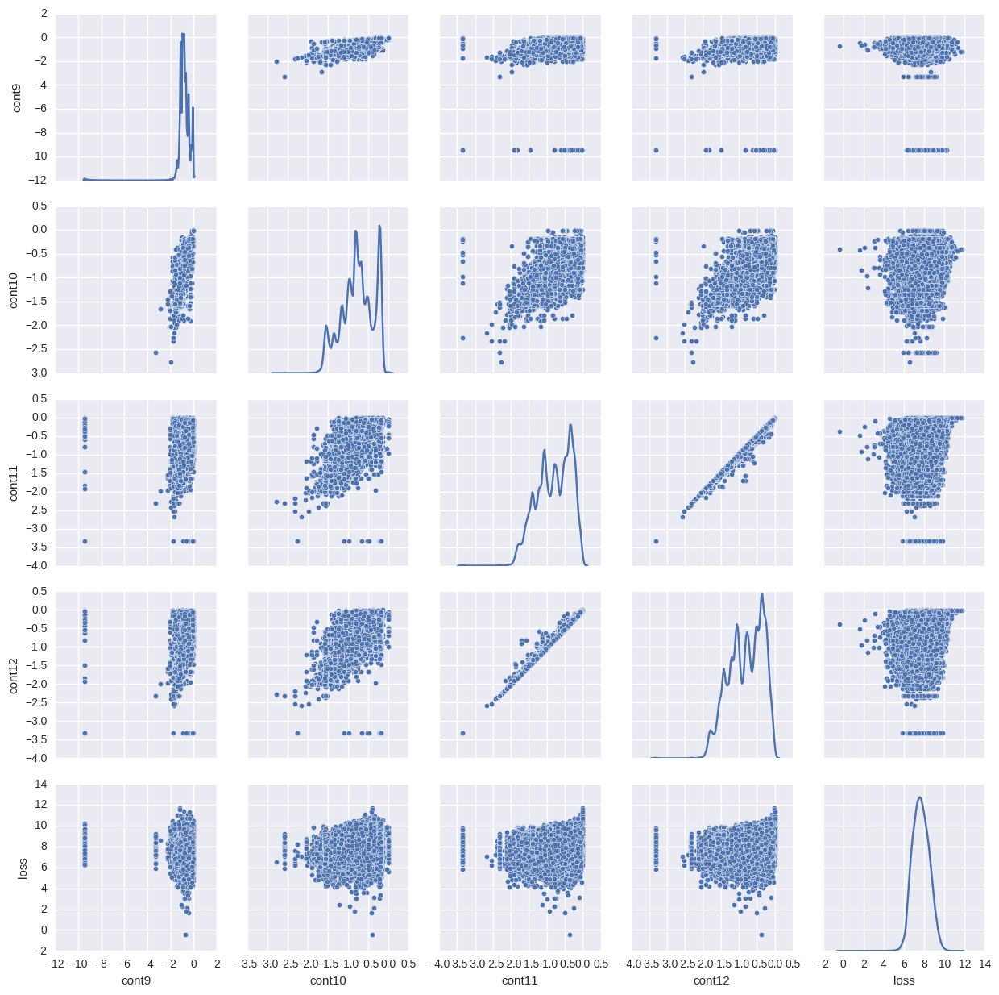

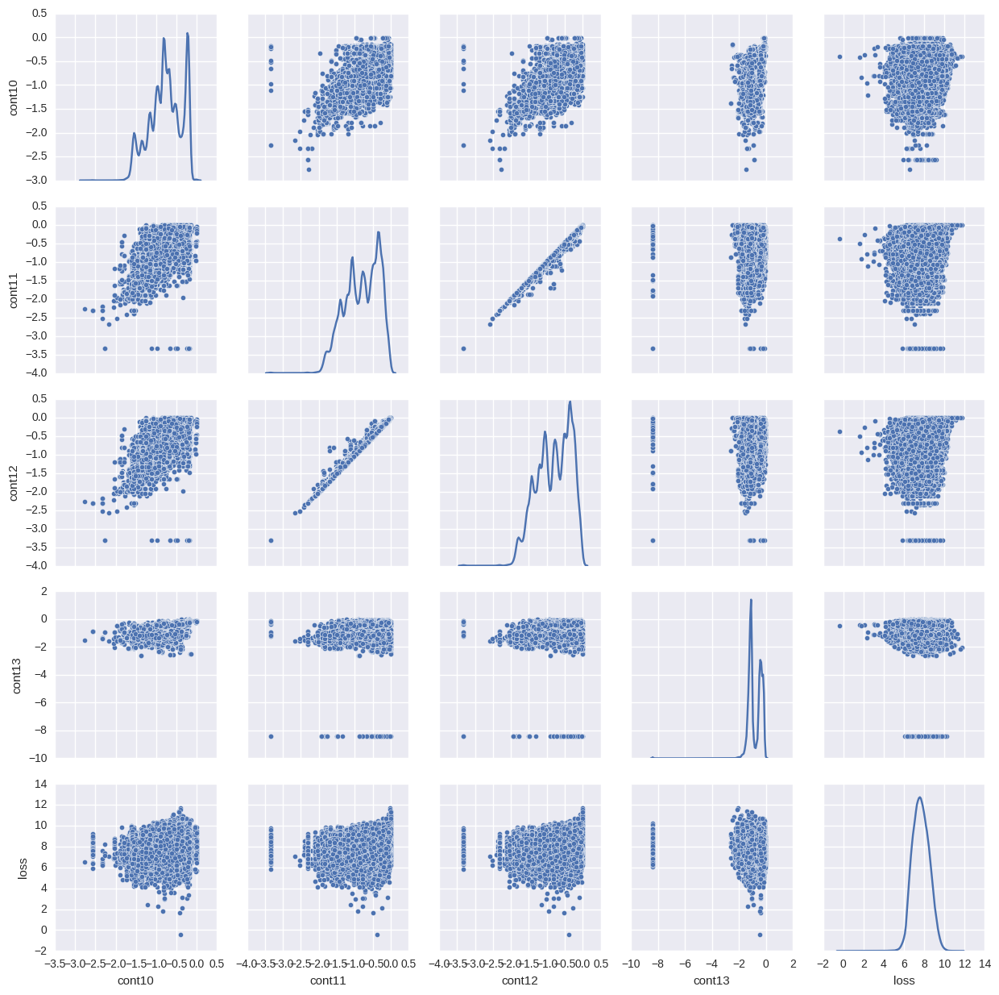

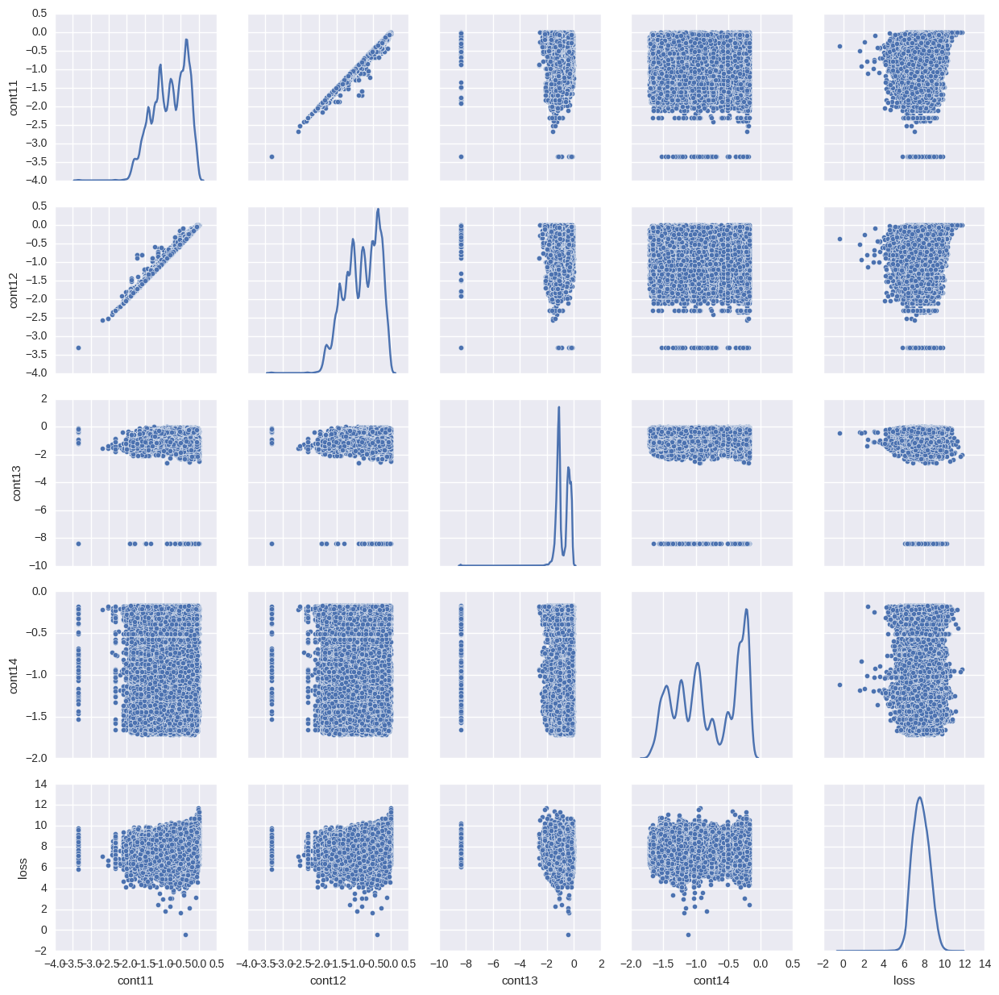

In [76]:
train_cont_log=np.log(train_cont)
#print train_cont_log.head(4)
train_log_data=pd.concat([train_cat,train_cont_log],axis=1)

print len(train_log_data)
#for i in range(len(train_log_data.columns.values)-4):
for i in range(len(train_cont_log.columns.values)-4):
 plt.figure()
 sns.pairplot(train_cont_log, vars=[train_cont_log.columns[i],train_cont_log.columns[i+1],train_cont_log.columns[i+2],train_cont_log.columns[i+3],'loss'], kind = 'scatter',diag_kind='kde')
 #sns.pairplot(train_log_data, vars=[train_log_data.columns[i],train_log_data.columns[i+1],train_log_data.columns[i+2],train_log_data.columns[i+3],'loss'], kind = 'scatter',diag_kind='kde')
 plt.show()



In [94]:

for i in training_data_1.columns:
    if (training_data_1[i].isfinite().sum() > 0):
      print("missing data in feature {}", i)


from sklearn.decomposition import PCA
import renders as rs 
# TODO: Apply PCA by fitting the good data with the same number of dimensions as features
pca = PCA(n_components=10)

#training_data_1=train_log_data.drop('loss',axis=1)
pca.fit(training_data_1)


# TODO: Transform the sample log-data using the PCA fit above
#pca_samples = pca.transform(log_samples)
#print pca_samples
#print pca.components_
#print pca.explained_variance_ratio_
# Generate PCA results plot
#pca_results = rs.pca_results(train_log_data, pca)
#plt.show()
print "PCA results"

AttributeError: 'Series' object has no attribute 'isfinite'

In [ ]:
Chose how many components to chose 

           0          1          2          3         4         5      loss
0  17.992124  -4.287915   6.119831 -10.131517  1.587930 -1.852106  7.702186
1  -8.490594  -4.016345   4.877697  -1.985559  6.199015  4.101933  7.157424
2  -8.706789   4.598650  -7.973606   1.932983 -6.716175  4.950724  8.008063
3 -15.295100  11.649350  -2.056640   0.045298  6.174475  0.583613  6.845720
4 -17.977499   6.876094  12.541960  -8.305745 -4.759225 -0.298117  7.924380
[0, 1, 2, 3, 4, 5, 'loss']
109


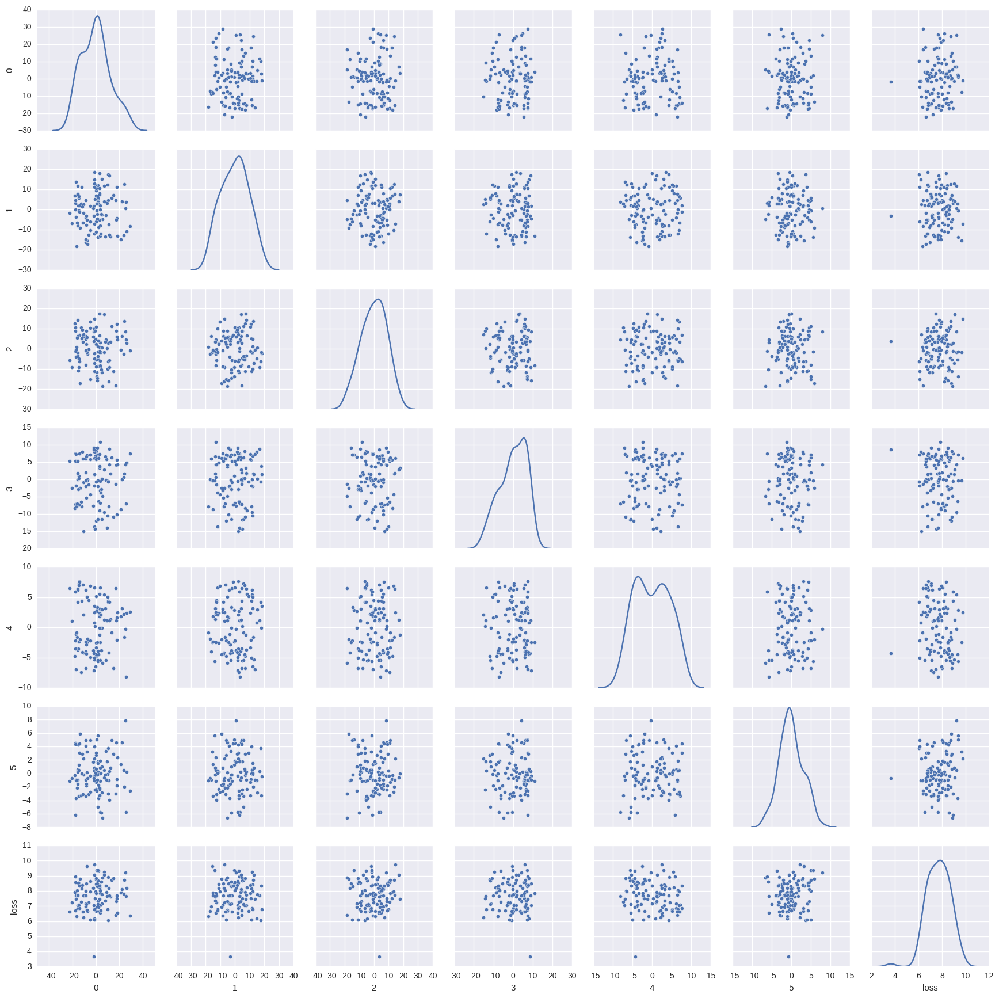

In [65]:
pca = PCA(n_components=6)
pca.fit(training_data_1)

# TODO: Transform the good data using the PCA fit above
reduced_data = pca.transform(training_data_1)

reduced_data_loss=pd.concat([pd.DataFrame(reduced_data),train_log_data['loss']],axis=1)
print reduced_data_loss.head(5)
print list(reduced_data_loss.columns)

print len(reduced_data_loss)
plt.figure()
sns.pairplot(reduced_data_loss, vars=list(reduced_data_loss.columns), kind = 'scatter',diag_kind='kde')
plt.show()

#reduced_data holds feature data
label_data=train_log_data[train_log_data.columns[-1]];


In [70]:
from sklearn.cross_validation import ShuffleSplit
from sklearn.metrics import mean_squared_error
from sklearn.cross_validation import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.cross_validation import cross_val_score
from sklearn.grid_search import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics.scorer import make_scorer

def performance_metric(y_true, y_predict):
    """ Calculates and returns the performance score between 
        true and predicted values based on the metric chosen. """
    
    # TODO: Calculate the performance score between 'y_true' and 'y_predict'
    score = r2_score(y_true,y_predict);
    
    # Return the score
    return score

def fit_model(X,Y):
    """ Performs grid search over the 'max_depth' parameter for a 
        decision tree regressor trained on the input data [X, y]. """
    
    # Create cross-validation sets from the training data
    cv_sets = ShuffleSplit(X.shape[0], n_iter = 10, test_size = 0.20, random_state = 0)
    
    # TODO: Create a decision tree regressor object
    regressor = DecisionTreeRegressor(max_leaf_nodes=30, random_state=0);
    
    # TODO: Create a dictionary for the parameter 'max_depth' with a range from 1 to 10
    params = {'max_depth': [1,2,3,4,5,6,7,8,9,10]}
    # TODO: Transform 'performance_metric' into a scoring function using 'make_scorer' 
    scoring_fnc = make_scorer(performance_metric,greater_is_better="FALSE");

    # TODO: Create the grid search object
    grid =  GridSearchCV(estimator=regressor,param_grid=params, cv=cv_sets,scoring=scoring_fnc);

    # Fit the grid search object to the data to compute the optimal model
    grid = grid.fit(X,Y)
    
    print "Best score", grid. best_score_; 
    # Return the opthimal model after fitting the data
    return grid.best_estimator_

# Fit the training data to the model using grid search
reg = fit_model(reduced_data, label_data)
# Produce the value for 'max_depth'
print "Parameter 'max_depth' is {} for the optimal model.".format(reg.get_params()['max_depth'])

Best score -0.279158336529
Parameter 'max_depth' is 1 for the optimal model.
